In [1]:
%%HTML
<h1 style="color: blue; text-align: center;"> Machine Learning Project </h1>
<h3 style="color: red; text-align: center;">Professor: Omkar Sir </h3>
<h2 style="color: green; text-align: center;"> Topic: Feature Engineering and Machine Learning for Predicting Price of 2nd hand Cars </h2>
<h4 style="color: brown; text-align: center;"><b> Name: Charu Saraswat </b>
<h4 style="color: brown; text-align: center;"><b>Roll Number: 8416 </b></h4>


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns

#Reading CSV file for cars sampled data.
cars_df = pd.read_csv('cars_sampled.csv')

In [3]:
cars_copy_of_data = cars_df.copy()
#This is a deep copy, any changes 
#made in cars_copy_of_data won't be reflected in cars_df 

In [4]:
cars_copy_of_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50001 entries, 0 to 50000
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   dateCrawled          50001 non-null  object
 1   name                 50001 non-null  object
 2   seller               50001 non-null  object
 3   offerType            50001 non-null  object
 4   price                50001 non-null  int64 
 5   abtest               50001 non-null  object
 6   vehicleType          44813 non-null  object
 7   yearOfRegistration   50001 non-null  int64 
 8   gearbox              47177 non-null  object
 9   powerPS              50001 non-null  int64 
 10  model                47243 non-null  object
 11  kilometer            50001 non-null  int64 
 12  monthOfRegistration  50001 non-null  int64 
 13  fuelType             45498 non-null  object
 14  brand                50001 non-null  object
 15  notRepairedDamage    40285 non-null  object
 16  date

In [5]:
pd.set_option('display.float_format',lambda x: '%.3f' % x)
pd.set_option('display.max_columns',10)
cars_copy_of_data.describe()

,price,yearOfRegistration,powerPS,kilometer,monthOfRegistration,postalCode
count,50001.000,50001.000,50001.000,50001.000,50001.000,50001.000
mean,6559.865,2005.544,116.496,125613.688,5.744,50775.217
std,85818.470,122.992,230.568,40205.234,3.711,25743.702
min,0.000,1000.000,0.000,5000.000,0.000,1067.000
25%,1150.000,1999.000,69.000,125000.000,3.000,30559.000
50%,2950.000,2003.000,105.000,150000.000,6.000,49504.000
75%,7190.000,2008.000,150.000,150000.000,9.000,71404.000
max,12345678.000,9999.000,19312.000,150000.000,12.000,99998.000


In [6]:
%%HTML
<h4 style="color: #45B39D;"><b>From data we can read there's a huge difference between mean and median which means the price is very skewed.Mean of yearoOfRegistration doesn't make sense because it is float but it should be integer.for powerPS min is 0 and for monthOfRegistration also it is 0. It doesnt make sense.</b></h4>

In [7]:
%%HTML
<h1 style="color:#6C3483 ; text-align: center;"><b>Feature Engineering </b></h1>

In [8]:
#Removing duplicate records
cars_copy_of_data.drop_duplicates(keep = 'first', inplace= True)

In [9]:
#Rows left after dropping duplicate columns are 49999
cars_copy_of_data.shape

(49999, 19)

In [10]:
%%HTML
<h3 style="color:#6C3483 ; text-align: center;"><b>Data Cleaning </b></h4>

In [11]:
#No of missing values in all columns
cars_copy_of_data.isnull().sum()

dateCrawled               0
name                      0
seller                    0
offerType                 0
price                     0
abtest                    0
vehicleType            5188
yearOfRegistration        0
gearbox                2824
powerPS                   0
model                  2758
kilometer                 0
monthOfRegistration       0
fuelType               4503
brand                     0
notRepairedDamage      9715
dateCreated               0
postalCode                0
lastSeen                  0
dtype: int64

In [12]:
yr_count = cars_copy_of_data['yearOfRegistration'].value_counts().sort_index()

In [13]:
print(">2018",sum(cars_copy_of_data['yearOfRegistration']>2018))
print("<1950 ",sum(cars_copy_of_data['yearOfRegistration']<1950))

>2018 26
<1950  39


<AxesSubplot:xlabel='yearOfRegistration', ylabel='price'>

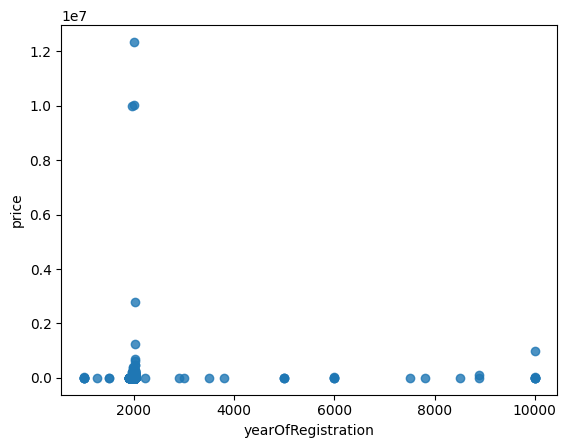

In [14]:
sum(cars_copy_of_data['yearOfRegistration']>2018)
sum(cars_copy_of_data['yearOfRegistration']<1950)
sns.regplot(x='yearOfRegistration', y= 'price', scatter = True,
   fit_reg=False, data= cars_copy_of_data)

/home/charus/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

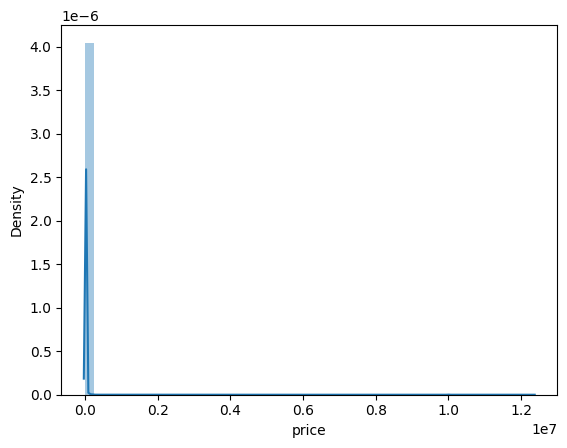

In [15]:
#variable price
price_count = cars_copy_of_data['price'].value_counts().sort_index()
sns.distplot(cars_copy_of_data['price'])


In [16]:
print(sum(cars_copy_of_data['price']>1500000))
print(sum(cars_copy_of_data['price']<100))
cars_copy_of_data['price'].describe()

'''Mean and Median are very far away which shows the skeweness in the data.
Also the min and max is very wide so have to narrow it down. '''

4
1784


'Mean and Median are very far away which shows the skeweness in the data.\nAlso the min and max is very wide so have to narrow it down. '

<AxesSubplot:ylabel='price'>

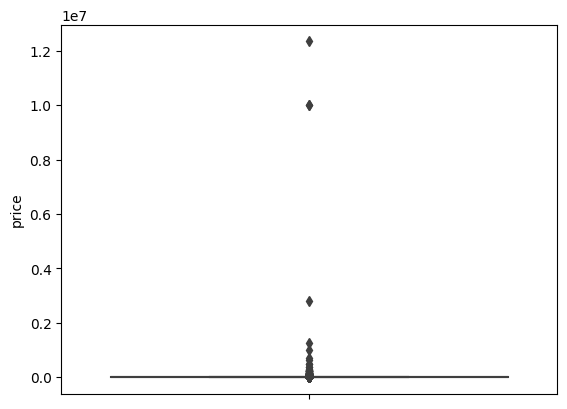

In [17]:
#To detect the outliers
sns.boxplot(y=cars_copy_of_data['price'])

In [18]:
cars_copy_of_data['vehicleType']

0            limousine
1                  suv
2                  bus
3            small car
4                  suv
             ...      
49996              bus
49997              NaN
49998            coupe
49999    station wagon
50000        small car
Name: vehicleType, Length: 49999, dtype: object

In [19]:
grouped_data = cars_copy_of_data.groupby('vehicleType')

In [20]:
cars_copy_of_data.dropna(how='all',inplace=True) #this will drop rows having all null
cars_copy_of_data.dropna(axis=1,how='all',inplace=True) #this will drop columns having all null

In [21]:
#After omitting missing rows came down to 49999 from 50001
cars_copy_of_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49999 entries, 0 to 50000
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   dateCrawled          49999 non-null  object
 1   name                 49999 non-null  object
 2   seller               49999 non-null  object
 3   offerType            49999 non-null  object
 4   price                49999 non-null  int64 
 5   abtest               49999 non-null  object
 6   vehicleType          44811 non-null  object
 7   yearOfRegistration   49999 non-null  int64 
 8   gearbox              47175 non-null  object
 9   powerPS              49999 non-null  int64 
 10  model                47241 non-null  object
 11  kilometer            49999 non-null  int64 
 12  monthOfRegistration  49999 non-null  int64 
 13  fuelType             45496 non-null  object
 14  brand                49999 non-null  object
 15  notRepairedDamage    40284 non-null  object
 16  date

In [22]:
cars_copy_of_data['gearbox'].isnull().sum()

2824

In [23]:
gearbox = cars_copy_of_data.groupby('gearbox')

In [24]:
gearbox.mean()

,price,yearOfRegistration,powerPS,kilometer,monthOfRegistration,postalCode
gearbox,,,,,,
automatic,10668.888,2004.531,171.383,122613.941,6.158,49858.681
manual,5267.466,2003.715,107.284,127169.965,5.816,51240.312


In [25]:
#Finding the mode for column gearbox
most_common_gearbox = cars_copy_of_data['gearbox'].value_counts().idxmax()
#Filling the most common value to the empty columns
cars_copy_of_data['gearbox'].fillna(most_common_gearbox, inplace=True)

In [26]:
# Now there are no null values in gearbox column
cars_copy_of_data['gearbox'].isnull().sum()

0

In [27]:
'''
Model tells about , the description of the car (of its model specifically and doesn't have any impact on its 
price, due to which dropping the column as part of Variable Deletion for Data Cleaning will be done).

'''
cars_copy_of_data.drop('model', axis=1, inplace=True)

In [28]:
'''
Column dateCrawled ,lastSeen,dateCreated cannot help in prediction of the price of the second hand cars, due to
which it will be a good idea to remove them .
'''
cars_copy_of_data.drop('dateCrawled', axis=1, inplace=True)
cars_copy_of_data.drop('lastSeen', axis=1, inplace=True)
cars_copy_of_data.drop('dateCreated',axis=1, inplace = True)

In [29]:
'''
Since the column "offerType" has only one unique value, "offer", it would not be necessary to use any encoding.
This column does not provide any useful information to the model, as all the values are the same. The model 
will not be able to learn any relationship between this column and the target variable. In this case, it would 
be best to remove the column from the dataset entirely.
'''
cars_copy_of_data.drop('offerType', axis=1, inplace=True)

In [30]:
'''For Prediction and our analysis the columns name and Postal Code are also not important'''
cars_copy_of_data.drop('name', axis=1, inplace=True)
cars_copy_of_data.drop('postalCode', axis=1, inplace=True)

In [31]:
cars_copy_of_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49999 entries, 0 to 50000
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   seller               49999 non-null  object
 1   price                49999 non-null  int64 
 2   abtest               49999 non-null  object
 3   vehicleType          44811 non-null  object
 4   yearOfRegistration   49999 non-null  int64 
 5   gearbox              49999 non-null  object
 6   powerPS              49999 non-null  int64 
 7   kilometer            49999 non-null  int64 
 8   monthOfRegistration  49999 non-null  int64 
 9   fuelType             45496 non-null  object
 10  brand                49999 non-null  object
 11  notRepairedDamage    40284 non-null  object
dtypes: int64(5), object(7)
memory usage: 5.0+ MB


In [32]:
cars_copy_of_data['vehicleType']

0            limousine
1                  suv
2                  bus
3            small car
4                  suv
             ...      
49996              bus
49997              NaN
49998            coupe
49999    station wagon
50000        small car
Name: vehicleType, Length: 49999, dtype: object

In [33]:
%%HTML
<h4 style="color: blue; text-align: center;"><b>The data is categorical for this variable vehicleType thus imputing the values with mode as this is important
feature and thus I can't completely delete it.</b></h4>

In [34]:
#Mode of the vehicle Type Column: 
most_common_vehicletype= cars_copy_of_data['vehicleType'].value_counts().idxmax()

#Filling the most common value to the empty columns
cars_copy_of_data['vehicleType'].fillna(most_common_vehicletype, inplace=True)

In [35]:
# Thus limousine is filled in most common type 
most_common_vehicletype

'limousine'

In [36]:
#since fuelType is categorical variable, using mode to impute values into it.
most_common_fueltype= cars_copy_of_data['fuelType'].value_counts().idxmax()

#Filling the most common value to the empty columns
cars_copy_of_data['fuelType'].fillna(most_common_fueltype, inplace=True)

In [37]:
cars_copy_of_data.isnull().sum()

seller                    0
price                     0
abtest                    0
vehicleType               0
yearOfRegistration        0
gearbox                   0
powerPS                   0
kilometer                 0
monthOfRegistration       0
fuelType                  0
brand                     0
notRepairedDamage      9715
dtype: int64

In [38]:
cars_copy_of_data['notRepairedDamage'].isnull().sum()

9715

In [39]:
%%HTML
<h4 style="color: blue; text-align: center;"><b>Since repairing the damage is important column for predicting the price of pre-owned cars it is not a good 
idea to drop this column, but the datatype is object, as it contains float and string both values.
Also the missing values are around 19.4% of whole data, which is quite high so it should be handled.It is important to understand, the meaning of this variable:
Status of repair for damages. If yes damages have not been rectified. If no damages are taken care of.</b></h4>

In [40]:
most_common_repaired= cars_copy_of_data['notRepairedDamage'].value_counts().idxmax()
cars_copy_of_data['notRepairedDamage'].fillna(most_common_repaired, inplace=True)

In [41]:
%%HTML
<h4 style="color: green; text-align: center;"><b>So for a good approach:
If my dataset has a large number of missing values, I should handle them first, as imputing the missing
values with the mode of the column before converting the data type will ensure that you don't lose any data.</b></h4>

In [42]:
cars_copy_of_data.isnull().sum()

seller                 0
price                  0
abtest                 0
vehicleType            0
yearOfRegistration     0
gearbox                0
powerPS                0
kilometer              0
monthOfRegistration    0
fuelType               0
brand                  0
notRepairedDamage      0
dtype: int64

In [43]:
%%HTML
<h4 style="color: blue; text-align: center;"><b> ----------- Null Values are Handled & Not Needed Columns are removed-----------</b></h4>

In [44]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Narrowing the range of dataset to use values that are practically useful</b></h4>

In [45]:
cars_copy_of_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49999 entries, 0 to 50000
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   seller               49999 non-null  object
 1   price                49999 non-null  int64 
 2   abtest               49999 non-null  object
 3   vehicleType          49999 non-null  object
 4   yearOfRegistration   49999 non-null  int64 
 5   gearbox              49999 non-null  object
 6   powerPS              49999 non-null  int64 
 7   kilometer            49999 non-null  int64 
 8   monthOfRegistration  49999 non-null  int64 
 9   fuelType             49999 non-null  object
 10  brand                49999 non-null  object
 11  notRepairedDamage    49999 non-null  object
dtypes: int64(5), object(7)
memory usage: 5.0+ MB


In [46]:
#Working with range of data
cars_copy_of_data = cars_copy_of_data[
    (cars_copy_of_data.yearOfRegistration <=2018)
    &(cars_copy_of_data.yearOfRegistration >= 1950)
    &(cars_copy_of_data.price>=100)
    &(cars_copy_of_data.price<=150000)
    &(cars_copy_of_data.powerPS >=10)
    &(cars_copy_of_data.powerPS <=500)
]

In [47]:
cars_copy_of_data.shape

(43153, 12)

In [48]:
#Creating new variables
cars_copy_of_data.loc[:,'monthOfRegistration']/=12
cars_copy_of_data.loc[:,'Age'] = (2018-cars_copy_of_data['yearOfRegistration'])+cars_copy_of_data['monthOfRegistration']
cars_copy_of_data.loc[:,'Age'] = round(cars_copy_of_data['Age'],2)
cars_copy_of_data['Age'].describe()

/home/charus/.local/lib/python3.8/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/home/charus/.local/lib/python3.8/site-packages/pandas/core/indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)


count   43153.000
mean       14.865
std         7.085
min         0.000
25%        10.250
50%        14.830
75%        19.170
max        67.750
Name: Age, dtype: float64

In [49]:
# A new column age is created from two exisiting columns 'yearOfRegistration','monthOfRegistration' and thus 
# Now the two columns can be dropped.
cars_copy_of_data = cars_copy_of_data.drop(columns=['yearOfRegistration','monthOfRegistration'],axis=1)

In [50]:
'''Visualizing the parameters after filling/dropping null values and narrowing the working range of data'''

'Visualizing the parameters after filling/dropping null values and narrowing the working range of data'

/home/charus/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Age', ylabel='Age'>

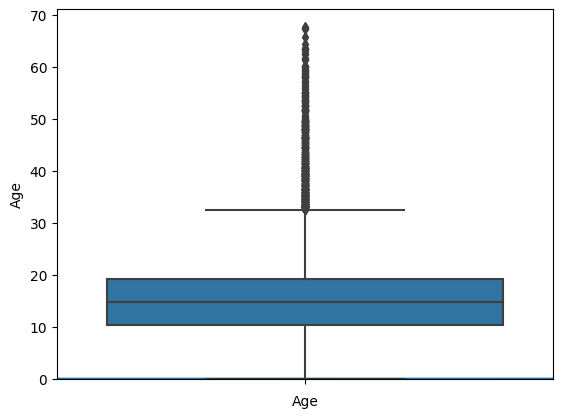

In [51]:
#Visualizing Parameter
#Age
sns.distplot(cars_copy_of_data['Age'])
sns.boxplot(y=cars_copy_of_data['Age'])

/home/charus/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='price'>

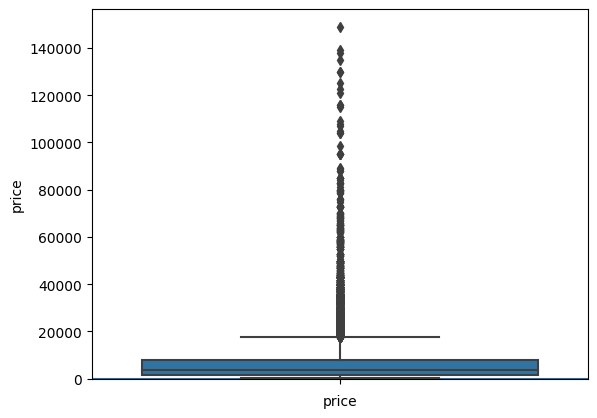

In [52]:
#Visualizing Parameter
#Price
sns.distplot(cars_copy_of_data['price'])
sns.boxplot(y=cars_copy_of_data['price'])

/home/charus/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/charus/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='price', ylabel='Density'>

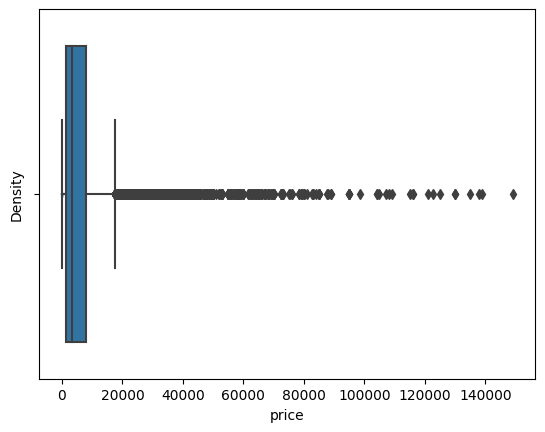

In [53]:
#powerPS
sns.distplot(cars_copy_of_data['powerPS'])
sns.boxplot(cars_copy_of_data['price'])

<AxesSubplot:xlabel='Age', ylabel='price'>

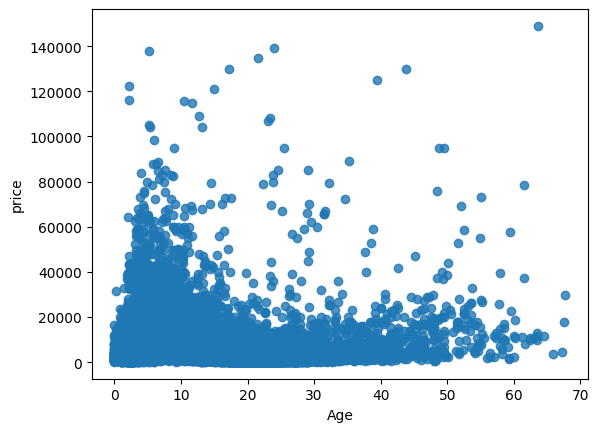

In [54]:
#Visualizing parameters after narrowing work range
sns.regplot(x='Age',y='price',scatter = True, fit_reg=False,data=cars_copy_of_data)

In [55]:
%%HTML
<h4 style="color: blue; text-align: center;"><b>After narrowing our work range were were able to understand relationship of different variables with price</b></h4>

<AxesSubplot:xlabel='powerPS', ylabel='price'>

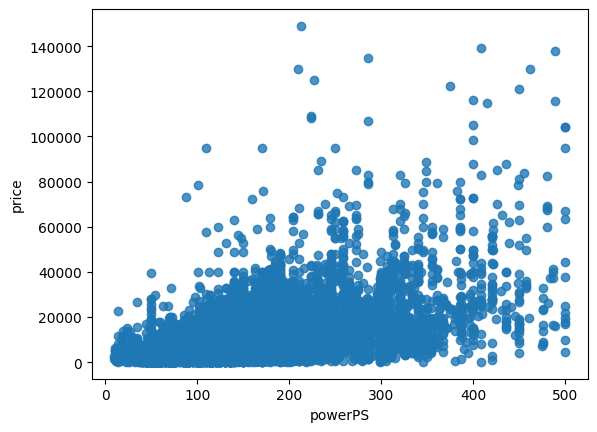

In [56]:
sns.regplot(x='powerPS',y='price',scatter = True,fit_reg=False,data=cars_copy_of_data)

In [57]:
%%HTML
<h4 style="color: blue; text-align: center;"><b>For Data Selection, all categorical variables are needed to be handled and for that Label Encoding is needed</b></h4>

In [58]:
print("Value counts for notRepairedDamage\n",cars_copy_of_data['notRepairedDamage'].value_counts())
print("checking unique values to check categories",cars_copy_of_data['notRepairedDamage'].unique())

print("Value counts for abtest\n",cars_copy_of_data['abtest'].value_counts())
print("checking unique values to check categories",cars_copy_of_data['abtest'].unique())

print("\nValue counts for seller\n",cars_copy_of_data['seller'].value_counts())
print("checking unique values to check categories",cars_copy_of_data['seller'].unique())

print("\nValue counts for vehicleType\n",cars_copy_of_data['vehicleType'].value_counts())
print("checking unique values to check categories",cars_copy_of_data['vehicleType'].unique())

print("\nValue counts for gearbox\n",cars_copy_of_data['gearbox'].value_counts())
print("checking unique values to check categories",cars_copy_of_data['gearbox'].unique())

print("\nValue counts for brand\n",cars_copy_of_data['brand'].value_counts())
print("checking unique values to check categories",cars_copy_of_data['brand'].unique())

cars_copy_of_data.shape

Value counts for notRepairedDamage
 no     39135
yes     4018
Name: notRepairedDamage, dtype: int64
checking unique values to check categories ['no' 'yes']
Value counts for abtest
 test       22336
control    20817
Name: abtest, dtype: int64
checking unique values to check categories ['test' 'control']

Value counts for seller
 private       43152
commercial        1
Name: seller, dtype: int64
checking unique values to check categories ['private' 'commercial']

Value counts for vehicleType
 limousine        14756
small car         9357
station wagon     8155
bus               3624
cabrio            2810
coupe             2276
suv               1847
others             328
Name: vehicleType, dtype: int64
checking unique values to check categories ['limousine' 'suv' 'bus' 'small car' 'coupe' 'station wagon' 'others'
 'cabrio']

Value counts for gearbox
 manual       33642
automatic     9511
Name: gearbox, dtype: int64
checking unique values to check categories ['manual' 'automatic']

Valu

(43153, 11)

In [59]:
%%HTML
<h4 style="color: green; text-align: center;"><b>Use of Label Encoding for Seller Type, Label encoding when the categorical variable is ordinal 
(there is a natural ordering to the categories) and one-hot encoding when the categorical variable is nominal 
(there is no natural ordering to the categories)</b></h4>

In [60]:
'''Since the values in the "seller" column are either "private" or "commercial", and there is only one 
"commercial" value, it may not make sense to create separate binary columns for each value using one-hot 
encoding. This is because one of the columns will have only one value, which would not provide any useful 
information to the model.'''

from sklearn.preprocessing import LabelEncoder
# create label encoder object
le = LabelEncoder()
cars_copy_of_data['seller']= le.fit_transform(cars_copy_of_data['seller'])

In [61]:
cars_copy_of_data['seller'].value_counts()

1    43152
0        1
Name: seller, dtype: int64

In [62]:
%%HTML
<h4 style="color: green; text-align: center;"><b>Use of One Hot Encoding for Variable 'abtest','vehicleType','gearbox','fuelType','notRepairedDamage'</b></h4>

In [63]:
'''
Since the values in the "abtest" column are either "test" or "control", and both values are present in the 
dataset in significant numbers, it would make sense to use one-hot encoding to create separate binary columns 
for each value and same logic goes for vehicleType and gearbox.
'''

'\nSince the values in the "abtest" column are either "test" or "control", and both values are present in the \ndataset in significant numbers, it would make sense to use one-hot encoding to create separate binary columns \nfor each value and same logic goes for vehicleType and gearbox.\n'

In [64]:
cars_copy_of_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43153 entries, 0 to 50000
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   seller             43153 non-null  int64  
 1   price              43153 non-null  int64  
 2   abtest             43153 non-null  object 
 3   vehicleType        43153 non-null  object 
 4   gearbox            43153 non-null  object 
 5   powerPS            43153 non-null  int64  
 6   kilometer          43153 non-null  int64  
 7   fuelType           43153 non-null  object 
 8   brand              43153 non-null  object 
 9   notRepairedDamage  43153 non-null  object 
 10  Age                43153 non-null  float64
dtypes: float64(1), int64(4), object(6)
memory usage: 4.0+ MB


In [65]:
cars_copy_of_data['vehicleType']

0            limousine
1                  suv
2                  bus
3            small car
4                  suv
             ...      
49991        limousine
49992        limousine
49993        small car
49995    station wagon
50000        small car
Name: vehicleType, Length: 43153, dtype: object

In [66]:
grouped_data = cars_copy_of_data.groupby('vehicleType')

In [67]:
#Checking name of all the groups
for name, group in grouped_data:
    print(name)

bus
cabrio
coupe
limousine
others
small car
station wagon
suv


In [68]:
# create a copy of the dataframe to work with
df_encoded = cars_copy_of_data.copy()

# one-hot encode the columns
df_encoded = pd.get_dummies(df_encoded, columns=['abtest', 'vehicleType', 'gearbox', 'fuelType', 'notRepairedDamage','brand'])

In [72]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43153 entries, 0 to 50000
Data columns (total 66 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   seller                     43153 non-null  int64  
 1   price                      43153 non-null  int64  
 2   powerPS                    43153 non-null  int64  
 3   kilometer                  43153 non-null  int64  
 4   Age                        43153 non-null  float64
 5   abtest_control             43153 non-null  uint8  
 6   abtest_test                43153 non-null  uint8  
 7   vehicleType_bus            43153 non-null  uint8  
 8   vehicleType_cabrio         43153 non-null  uint8  
 9   vehicleType_coupe          43153 non-null  uint8  
 10  vehicleType_limousine      43153 non-null  uint8  
 11  vehicleType_others         43153 non-null  uint8  
 12  vehicleType_small car      43153 non-null  uint8  
 13  vehicleType_station wagon  43153 non-null  uin

In [73]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Using Correlation heatmap for feature selection</b></h3>

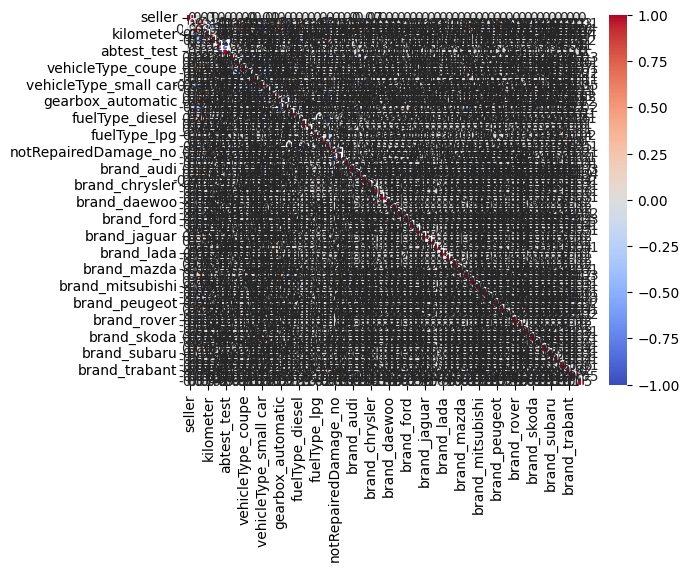

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# calculate the correlation matrix
corr = df_encoded.corr().round(2)

# create a heatmap of the correlation matrix
sns.heatmap(corr, cmap='coolwarm', annot=True)

# show the plot
plt.show()


In [75]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Due to One-hot Encoding of many features, the problem of multicollinearity has arrived thus using PCA</b></h3>

In [76]:
'''
Why applying PCA (In Detail)
If the encoding of categorical variables was done using one hot encoding, there may be many features that are 
highly correlated, which can lead to multicollinearity problems. In this case, it is good to consider using 
dimensionality reduction techniques such as Principal Component Analysis (PCA) before applying feature 
selection.
'''

'\nWhy applying PCA (In Detail)\nIf the encoding of categorical variables was done using one hot encoding, there may be many features that are \nhighly correlated, which can lead to multicollinearity problems. In this case, it is good to consider using \ndimensionality reduction techniques such as Principal Component Analysis (PCA) before applying feature \nselection.\n'

In [77]:
'''
Principal components are the directions in the feature space of a dataset that have the highest variance. 
These directions are calculated from the eigenvectors of the covariance matrix of the data.
Linear combinations of the original features, these new features are uncorrelated, and they are ordered by the
amount of variance they explain in the data, which makes them useful in feature selection and dimensionality 
reduction.
'''

'\nPrincipal components are the directions in the feature space of a dataset that have the highest variance. \nThese directions are calculated from the eigenvectors of the covariance matrix of the data.\nLinear combinations of the original features, these new features are uncorrelated, and they are ordered by the\namount of variance they explain in the data, which makes them useful in feature selection and dimensionality \nreduction.\n'

In [78]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Doing PCA and Feature Selection using f_regression</b></h3>

In [79]:
from sklearn.decomposition import PCA
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_classif

# load your dataset into a numpy array
data = np.array(df_encoded)

# standardize the data
data = (data - data.mean(axis=0)) / data.std(axis=0)

# split the data into features and target
X = data[:, :-1]
y = data[:, -1]


# perform PCA
pca = PCA(n_components='mle')
X_pca = pca.fit_transform(X)
explained_variance_ratio_before = pca.explained_variance_ratio_

# perform feature selection using f_regression
selector = SelectKBest(score_func=f_regression, k=20)
X_new = selector.fit_transform(X_pca, y)


In [80]:
'''
The first principal component is the direction that explains the most variance in the data, the second 
principal component is the direction that explains the second most variance, and so on. In other words, the 
principal components are the directions that capture the most amount of information or structure in the data.
'''

'\nThe first principal component is the direction that explains the most variance in the data, the second \nprincipal component is the direction that explains the second most variance, and so on. In other words, the \nprincipal components are the directions that capture the most amount of information or structure in the data.\n'

In [81]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Plotting 2-D and 3-D graphs for (1st and 2nd) and (1st,2nd & 3rd Principal Components) </b></h3>

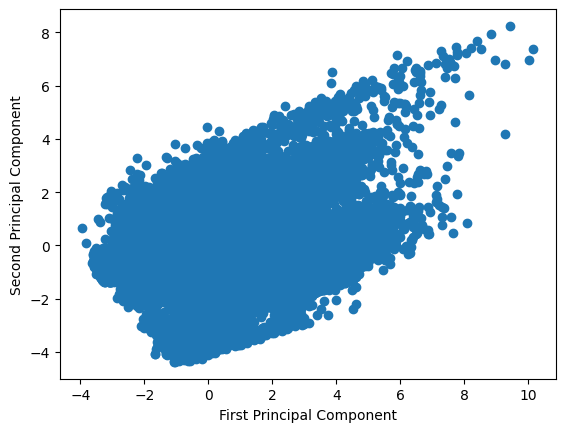

In [82]:
import matplotlib.pyplot as plt
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()


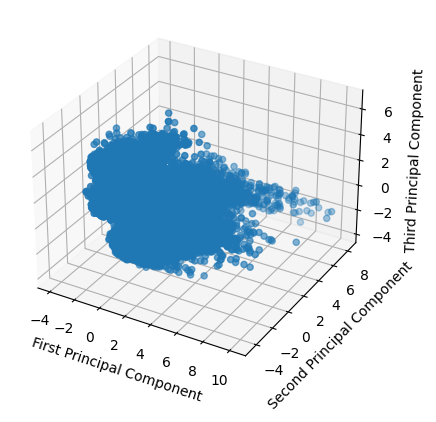

In [83]:
from mpl_toolkits.mplot3d import Axes3D

# Plot the first, second, and third principal components
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2])
ax.set_xlabel('First Principal Component')
ax.set_ylabel('Second Principal Component')
ax.set_zlabel('Third Principal Component')
plt.show()


In [84]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Use the scores_ attribute of the SelectKBest object to see the scores of each feature and compare them to the 
 scores of the original features:</b></h3>

In [85]:
from sklearn.feature_selection import SelectKBest

#print the scores of each feature before and after feature selection
print("Original feature scores:\n", selector.scores_,"\n")
print("Selected feature scores:\n", selector.scores_[selector.get_support()])


Original feature scores:
 [3.06868002e+01 4.26860400e+01 3.23738792e+01 1.01450158e+00
 1.40304310e+01 4.03597175e+00 1.40682622e+02 1.56457091e+01
 7.70446771e+01 3.60638653e+00 4.82239620e+00 2.03588086e+00
 6.75085436e-02 6.32833133e+00 1.72348422e+00 3.57224158e+00
 5.28918530e+00 8.24491139e+00 4.49431781e-02 4.29169103e+00
 1.06718188e+00 3.88256156e-01 2.71675777e+00 4.84129790e-01
 1.69652507e-01 1.35637383e+00 1.75891978e-03 1.66082582e-01
 2.04588309e-02 2.15500704e-01 8.84589880e-04 7.53350611e-03
 2.06825349e-02 2.71853928e-02 5.24704076e-02 9.54200046e-02
 3.19219120e-05 2.33497170e-02 5.48426676e-02 6.61859132e-03
 3.57787637e-01 4.52538228e+00 3.07038044e-02 1.32912866e+01
 2.41135696e-03 1.94417333e+00 2.78138864e+01 3.15772066e+01
 1.75599597e+01 2.76068941e+00 9.72770905e+00 3.44404448e-02
 1.19431749e+01 1.61590015e+02 6.41623522e+01 5.15793260e+00
 9.44318290e+00 3.17890560e+01 1.41634259e+00 2.28800472e+06] 

Selected feature scores:
 [3.06868002e+01 4.26860400e+01

In [86]:
%%HTML
<h3 style="color: green; text-align: center;"><b>Plot the explained variance ratio of the principal components before and after feature selection to see how
 much of the original variance is retained after feature selection:</b></h3>

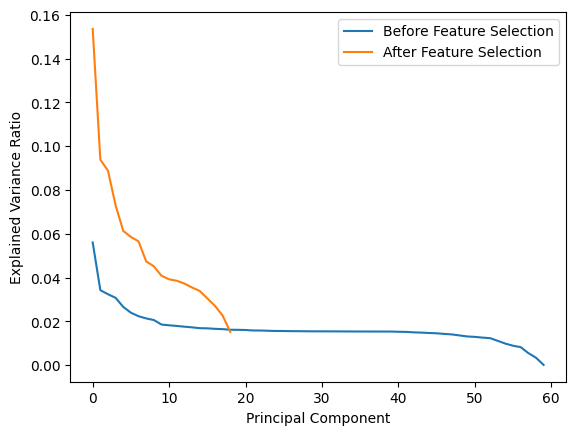

In [87]:

# perform PCA on the selected features
pca.fit(X_new)
explained_variance_ratio_after = pca.explained_variance_ratio_
# plot the explained variance ratio before and after feature selection
plt.plot(explained_variance_ratio_before, label='Before Feature Selection')
plt.plot(explained_variance_ratio_after, label='After Feature Selection')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.legend()
plt.show()

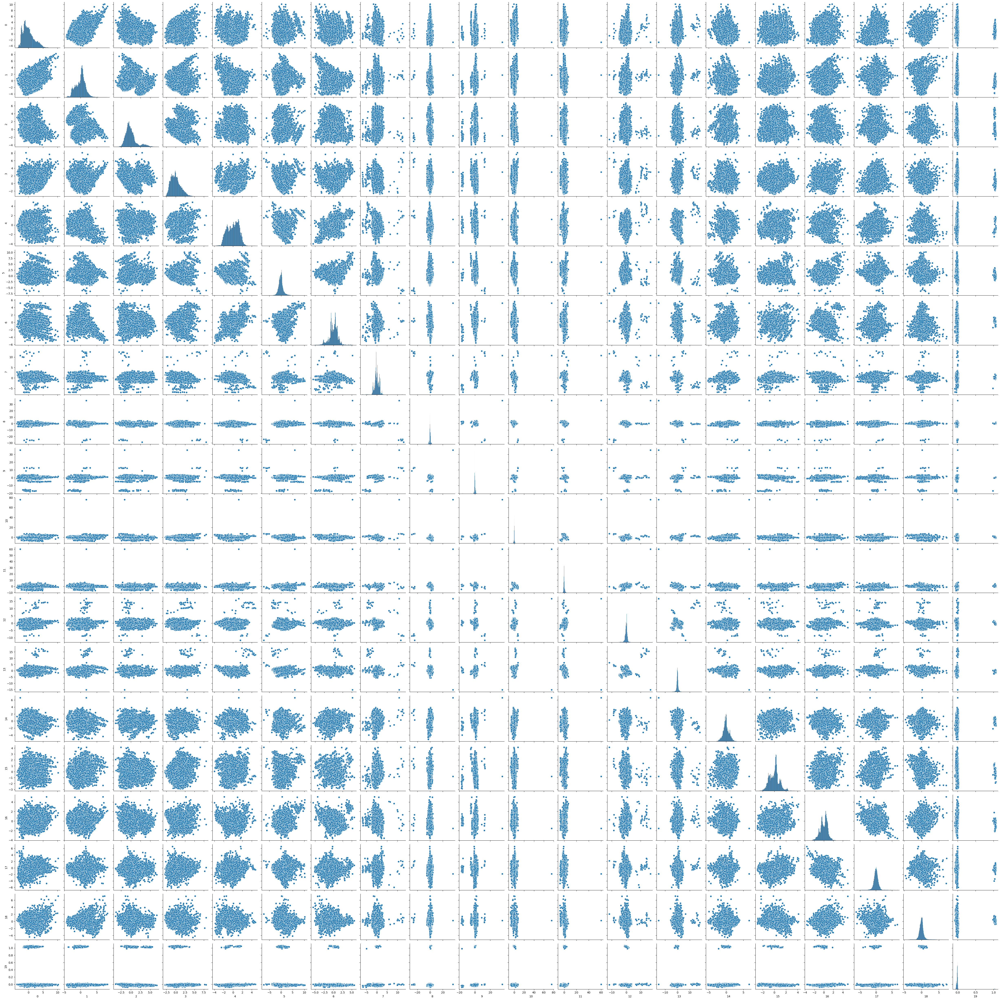

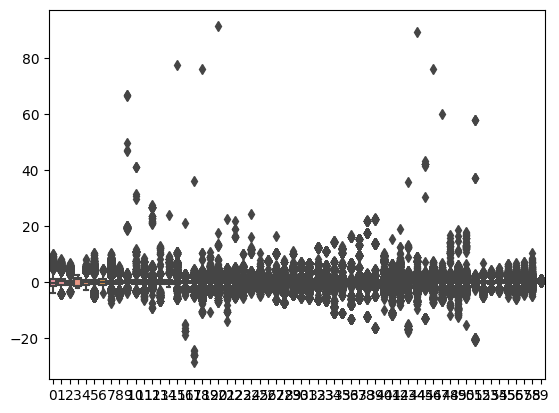

In [88]:
# visualize the distribution of the selected features using scatter plot
sns.pairplot(pd.DataFrame(X_new))
plt.show()

# visualize the distribution of the original features using box plot
sns.boxplot(data=pd.DataFrame(X_pca))
plt.show()

In [89]:
%%HTML
<h2 style="color: #9F2B68; text-align: center;"><b>Applying Machine Learning Models</b></h2>

In [90]:
%%HTML
<h3 style="color:#AA336A; text-align: center;"><b>Linear Regression</b></h3>

In [91]:
#Creating a linear regression model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)

# create a Linear Regression model
reg = LinearRegression()

# fit the model on the training data
reg.fit(X_train, y_train)

# predict on the test data
y_pred = reg.predict(X_test)

# calculate the mean squared error of the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error: ", mse)


Mean Squared Error:  0.00126613795520915


R-squared:  0.9987279742205077
Mean Absolute Error:  0.0276791583410985


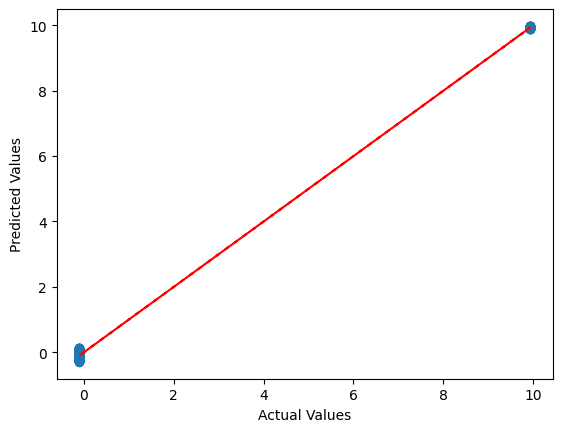

In [92]:
from sklearn.metrics import r2_score, mean_absolute_error
import matplotlib.pyplot as plt

# calculate the R-squared
r2 = r2_score(y_test, y_pred)
print("R-squared: ", r2)

# calculate the MAE
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error: ", mae)

import numpy as np

# plot the predicted vs actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# calculate the trend line
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test),"r--")

plt.show()



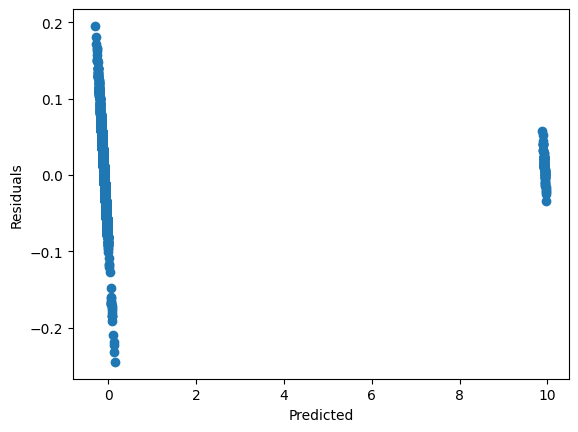

In [93]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.show()


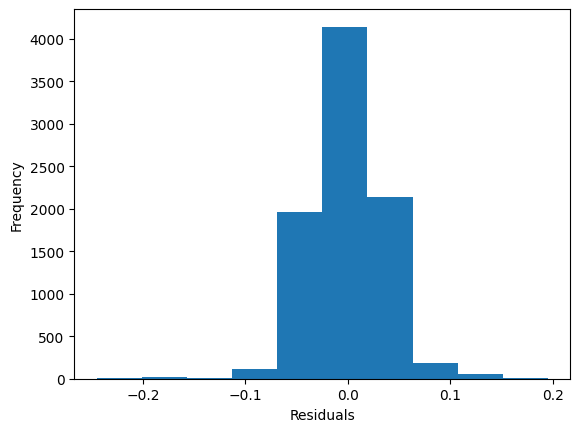

In [94]:
plt.hist(residuals)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()


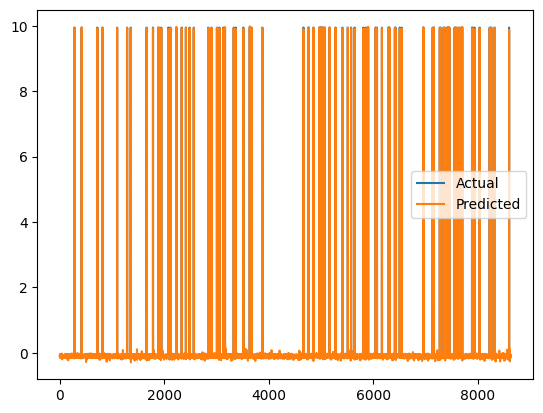

In [95]:
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend(loc='best')
plt.show()


In [96]:
%%HTML
<h4 style="color: #AA336A; text-align: center;"><b>To Check if the model is overfitting or not</b></h4>

In [97]:
#Checking the performance on training and test set
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

# initialize the model
model = LinearRegression()

# train the model on the training set
model.fit(X_train, y_train)

# make predictions on the training set
y_train_pred = model.predict(X_train)

# calculate the training set MSE
train_mse = mean_squared_error(y_train, y_train_pred)
print("Training set MSE: ", train_mse)

# make predictions on the test set
y_test_pred = model.predict(X_test)

# calculate the test set MSE
test_mse = mean_squared_error(y_test, y_test_pred)
print("Test set MSE: ", test_mse)


Training set MSE:  0.001236913858274115
Test set MSE:  0.00126613795520915


In [98]:
'''
These values indicate that the model is performing well on both the training and test sets. The MSE value for 
the training set is slightly lower than the test set, which is expected because the model is trained to fit 
the training set. The fact that the test set MSE is close to the training set MSE suggests that the model is 
not overfitting the data.
'''

'\nThese values indicate that the model is performing well on both the training and test sets. The MSE value for \nthe training set is slightly lower than the test set, which is expected because the model is trained to fit \nthe training set. The fact that the test set MSE is close to the training set MSE suggests that the model is \nnot overfitting the data.\n'

In [99]:
%%HTML
<h3 style="color: #AA336A; text-align: center;"><b>Lasso and Ridge Regression</b></h3>

In [100]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score

# train a Lasso model
lasso = Lasso()
lasso.fit(X_new, y)

# make predictions
y_pred_lasso = lasso.predict(X_new)

# evaluate the model
mse_lasso = mean_squared_error(y, y_pred_lasso)
r2_lasso = r2_score(y, y_pred_lasso)
print("Lasso:")
print("Mean squared error: ", mse_lasso)
print("R-squared value: ", r2_lasso)

# train a Ridge model
ridge = Ridge()
ridge.fit(X_new, y)

# make predictions
y_pred_ridge = ridge.predict(X_new)

# evaluate the model
mse_ridge = mean_squared_error(y, y_pred_ridge)
r2_ridge = r2_score(y, y_pred_ridge)
print("\nRidge:")
print("Mean squared error: ", mse_ridge)
print("R-squared value: ", r2_ridge)


Lasso:
Mean squared error:  0.9999999999999994
R-squared value:  0.0

Ridge:
Mean squared error:  0.001246672110598254
R-squared value:  0.9987533278894017


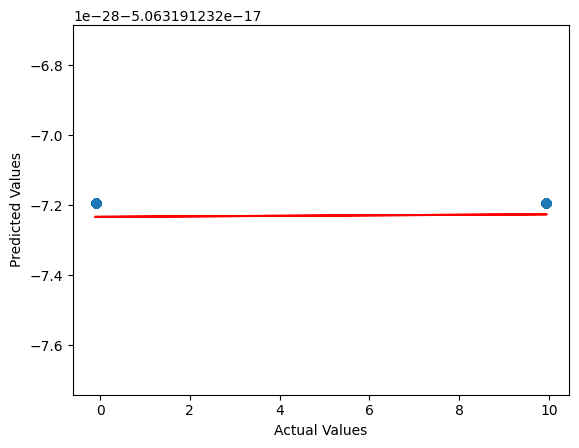

In [101]:
#For lasso 
import matplotlib.pyplot as plt

# scatter plot for Lasso
plt.scatter(y, y_pred_lasso)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")

# fit a line of best fit to the data
coefs = np.polyfit(y, y_pred_lasso, deg=1)
plt.plot(y, coefs[0]*y+coefs[1], '-r')
plt.show()


Text(0.5, 1.0, 'Actual vs Predicted Values for Ridge')

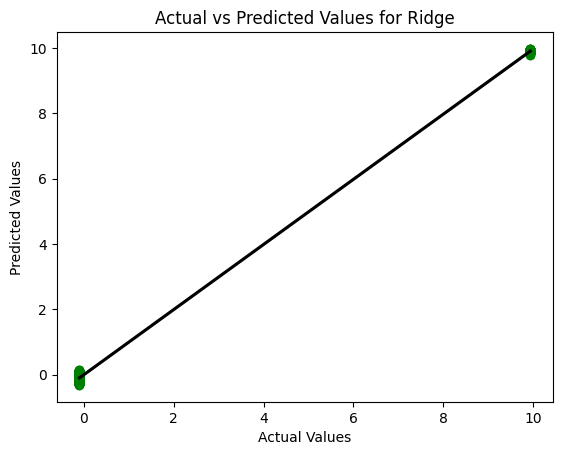

In [102]:

plt.figure()
sns.regplot(x=y, y=y_pred_ridge, scatter_kws={'color':'green'}, line_kws={'color':'black'})
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values for Ridge")


In [103]:
'''
This means that the Ridge model is able to make predictions that are much closer to the true values and it 
explains a large proportion of the variation in the target variable. On the other hand, Lasso model is not able
to make good predictions and it explains very little of the variation in the target variable.

The reason Lasso is performing poorly is because it performs feature selection while Ridge doesn't, and in this
case, the features selected by Lasso are not useful for the prediction task.
'''

"\nThis means that the Ridge model is able to make predictions that are much closer to the true values and it \nexplains a large proportion of the variation in the target variable. On the other hand, Lasso model is not able\nto make good predictions and it explains very little of the variation in the target variable.\n\nThe reason Lasso is performing poorly is because it performs feature selection while Ridge doesn't, and in this\ncase, the features selected by Lasso are not useful for the prediction task.\n"

In [104]:
%%HTML
<h3 style="color: #AA336A; text-align: center;"><b>Random Forest</b></h3>

In [105]:
from sklearn.ensemble import RandomForestRegressor

# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=0)

# initialize the model
rf_model = RandomForestRegressor()

# train the model on the training set
rf_model.fit(X_train, y_train)

# make predictions on the test set
y_test_pred = rf_model.predict(X_test)

# calculate the test set MSE
test_mse = mean_squared_error(y_test, y_test_pred)
print("Test set MSE: ", test_mse)

Test set MSE:  4.6065495552000363e-29


R-squared:  1.0
Mean Absolute Error:  6.757347484767787e-15


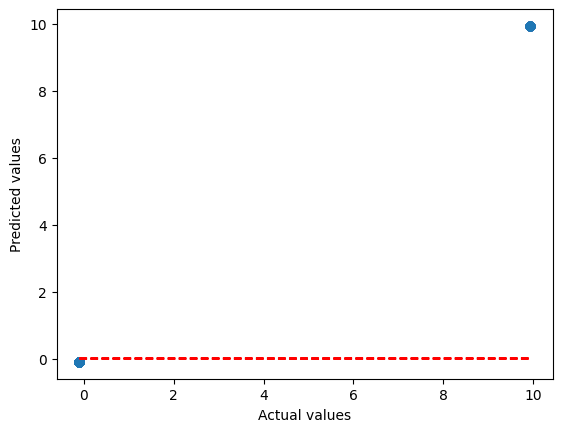

'\nThis indicates that the model is able to predict the target variable very accurately. However,as the R-squared \nand MAE scores are too high and too low respectively\n'

In [106]:
from sklearn.metrics import r2_score, mean_absolute_error
import matplotlib.pyplot as plt

# calculate R-squared
r2 = r2_score(y_test, y_test_pred)
print("R-squared: ", r2)

# calculate Mean Absolute Error
mae = mean_absolute_error(y_test, y_test_pred)
print("Mean Absolute Error: ", mae)

# plot predicted vs actual values
plt.scatter(y_test, y_test_pred)
plt.xlabel("Actual values")
plt.ylabel("Predicted values")

# calculate the trend line
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test),"r--")

plt.show()
plt.show()

'''
This indicates that the model is able to predict the target variable very accurately. However,as the R-squared 
and MAE scores are too high and too low respectively
'''

In [107]:
'''
 MSE of 4.657477640795465e-29 is extremely small and may indicate that the model is overfitting the data, which
 means it's memorizing the training set instead of generalizing to new data.
'''

"\n MSE of 4.657477640795465e-29 is extremely small and may indicate that the model is overfitting the data, which\n means it's memorizing the training set instead of generalizing to new data.\n"

In [108]:
%%HTML
<h3 style="color: #AA336A; text-align: center;"><b>Support Vector Machine</b></h3>

In [109]:

from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error

# train an SVR model
svr = SVR(kernel='linear')
svr.fit(X_new, y)

# make predictions
y_pred = svr.predict(X_new)

# evaluate the model
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)
print("Mean squared error: ", mse)
print("R-squared value: ", r2)
mae = mean_absolute_error(y, y_pred)
print("Mean Absolute Error: ", mae)



Mean squared error:  0.0021072410999206288
R-squared value:  0.9978927589000793
Mean Absolute Error:  0.03841823932755654


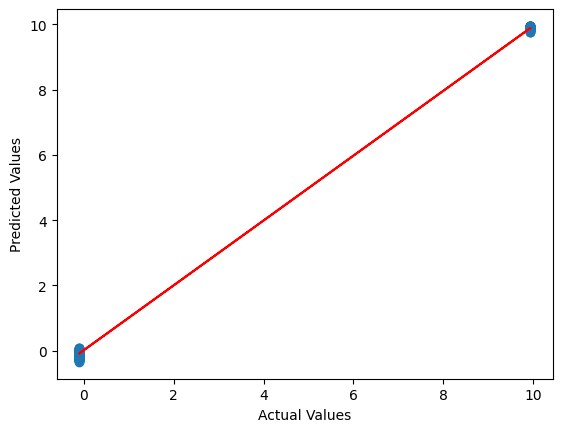

In [110]:
# fit a line of best fit to the data
coefs = np.polyfit(y, y_pred, deg=1)
# plot the scatter plot with the line of best fit
plt.scatter(y, y_pred)
plt.plot(y, coefs[0]*y+coefs[1], '-r')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()


In [111]:
%%HTML
<h3 style="color: #AA336A; text-align: center;"><b>SVM with polynomial and RBF</b></h3>

In [112]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# train an SVR model with rbf kernel
svr_rbf = SVR(kernel='rbf')
svr_rbf.fit(X_new, y)

# make predictions
y_pred_rbf = svr_rbf.predict(X_new)

# evaluate the model
mse_rbf = mean_squared_error(y, y_pred_rbf)
r2_rbf = r2_score(y, y_pred_rbf)
print("RBF kernel:")
print("Mean squared error: ", mse_rbf)
print("R-squared value: ", r2_rbf)

# train an SVR model with poly kernel
svr_poly = SVR(kernel='poly')
svr_poly.fit(X_new, y)

# make predictions
y_pred_poly = svr_poly.predict(X_new)

# evaluate the model
mse_poly = mean_squared_error(y, y_pred_poly)
r2_poly = r2_score(y, y_pred_poly)
print("\npoly kernel:")
print("Mean squared error: ", mse_poly)
print("R-squared value: ", r2_poly)


RBF kernel:
Mean squared error:  0.05897391651374154
R-squared value:  0.9410260834862585

poly kernel:
Mean squared error:  0.4271146244493954
R-squared value:  0.5728853755506044


Since the R-squared value is high it can be said that my model is linearly seperable due to which 
linear kernel is well suited for the same

In [113]:
%%HTML
<h4 style="color: #AA336A; text-align: center;">The Linear Regression model has the <b>best performance</b> 
among the models. The R-squared value of Linear Regression is 0.9987 and MSE value is 0.0012 which is close to
zero, indicating a good fit of the model.</h4>
<h4 style="color: #AA336A; text-align: center;">Random Forest is over-fitting.</h3>
<h4 style="color: #AA336A; text-align: center;">The Lasso model has the lowest R-squared value of 0.0 and a high MSE of 0.9999999999999994, indicating that it is not a good fit for the data.</h4>
<h4 style="color: #AA336A; text-align: center;">Ridge model has a high R-squared value of 0.9987533278894017 and low MSE of 0.001246672110598254.</h4>
<h4 style="color: #AA336A; text-align: center;">SVM has a high R-squared value of 0.9978927589000793 and low MSE of 0.0021072410999206288.</h4>


In [114]:
%%HTML
<h1 style="color: #AA336A; text-align: center;">Thankyou </h1>